# Ali Keramati
### Neural Network from scratch


# Goal
We are going to train a Neural Network on persian digits dataset.

# Description
In this exercise, in the first part, you will implement a Feed Forward neural network from the ground up using the NumPy library. In the second part, with the help of the codes of the first part, you will train some neural networks on the given events and you will examine the effect of some parameters in the learning process.

In [ ]:
import pickle
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import random
from numpy import empty
import warnings



In [ ]:
pkl_file = open('data.pkl', 'rb')
data = pickle.load(pkl_file)

pkl_file = open('labels.pkl', 'rb')
label = pickle.load(pkl_file)

In [ ]:
df = pd.DataFrame()
df['label'] = None
df['pixels'] = None
df

,label,pixels


In [ ]:
df['label'] = label
df['pixels'] = data
df

,label,pixels
0,6,"[[0, 0, 0, 0, 255, 255, 0, 0, 0, 0, 0, 0, 0, 0..."
1,5,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 255, 255, 0, 0..."
2,0,"[[0, 255, 255, 255, 255, 255, 255, 255, 255, 0..."
3,2,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,..."
4,7,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,..."
...,...,...
102347,6,"[[0, 0, 0, 0, 0, 255, 0, 0, 0, 0, 0, 0, 0, 0, ..."
102348,1,"[[0, 255, 0, 0, 0, 0], [255, 255, 255, 0, 0, 0..."
102349,0,"[[0, 0, 0, 0, 0, 255, 255, 255, 255, 0, 0, 0, ..."
102350,8,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 255, 255, 255, 25..."


In [ ]:
train, test = train_test_split(df, random_state=42, test_size=0.25)

In [ ]:
print("length of train datas is:", len(train))
print("length of test datas is:", len(test))

length of train datas is: 76764
length of test datas is: 25588


# Part One: Data review and Preprocessing

- # 1 Random index

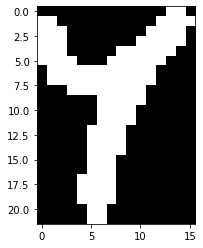

In [ ]:
rand_idx = random.randint(0, len(train))
plt.imshow(train.iloc[rand_idx].pixels, cmap='gray', interpolation='nearest')
plt.show()

In [ ]:
min_val = np.min(train.iloc[rand_idx].pixels)
max_val = np.max(train.iloc[rand_idx].pixels)
print("Values per pixel is in range", min_val, "and", max_val)

Values per pixel is in range 0 and 255


- # 2 Resize

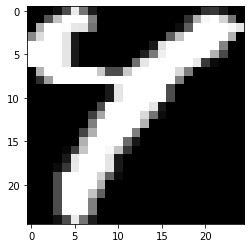

In [ ]:
import cv2
new_data = []
for d in data:
    new_data.append(cv2.resize(d, dsize=(25, 25)))

plt.imshow(new_data[rand_idx], cmap='gray', interpolation='nearest')
plt.show()

In [ ]:
df['label'] = label
df['pixels'] = new_data

In [ ]:
train, test = train_test_split(df, random_state=42, test_size=0.25)

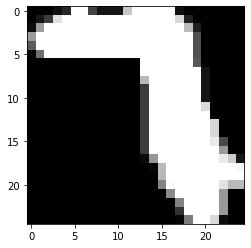

In [ ]:
rand_idx = random.randint(0, len(train))
plt.imshow(train.iloc[rand_idx].pixels, cmap='gray', interpolation='nearest')
plt.show()

- # 3 Image selection from each class

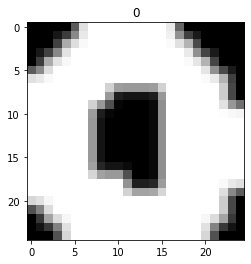

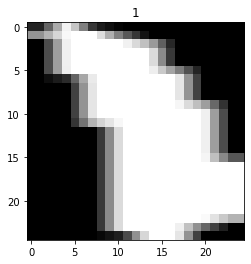

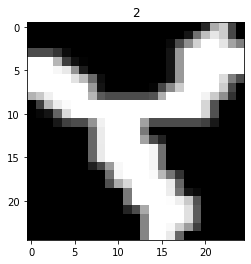

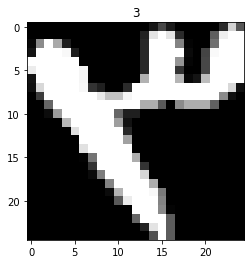

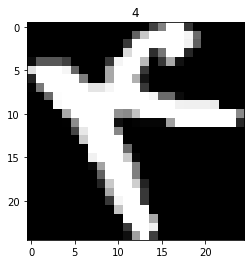

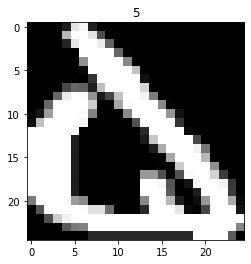

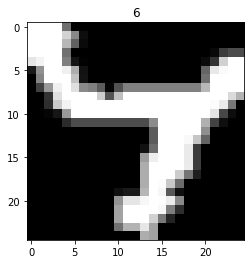

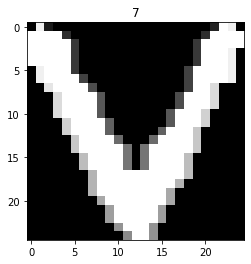

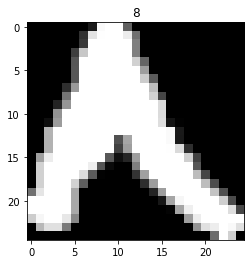

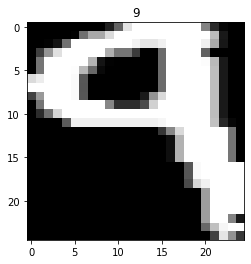

In [ ]:
for i in range(0, 10):
    curr_class = train[train['label'] == i]
    plt.imshow(curr_class.iloc[0].pixels, cmap='gray', interpolation='nearest')
    plt.title(i)
    plt.show()

- # 4 Train and Test counts and bar plots

In [ ]:
train_counts = train['label'].value_counts().sort_index()
print("Number of images in each class of train data:\n", train_counts)
test_counts = test['label'].value_counts().sort_index()
print("\nNumber of images in each class of test data:\n", test_counts)

Number of images in each class of train data:
 0    7592
1    7772
2    7443
3    7687
4    7785
5    7603
6    7725
7    7730
8    7666
9    7761
Name: label, dtype: int64

Number of images in each class of test data:
 0    2478
1    2558
2    2480
3    2647
4    2548
5    2507
6    2529
7    2633
8    2598
9    2610
Name: label, dtype: int64


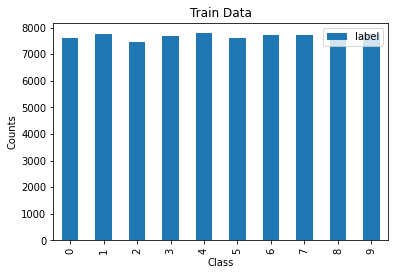

In [ ]:
plotdata = pd.DataFrame(train_counts)
plotdata.plot(kind='bar')
plt.xlabel('Class')
plt.ylabel('Counts')
plt.title('Train Data');

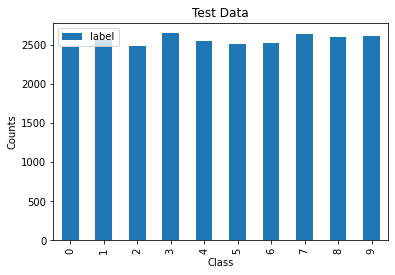

In [ ]:
plotdata = pd.DataFrame(test_counts)
plotdata.plot(kind='bar')
plt.xlabel('Class')
plt.ylabel('Counts')
plt.title('Test Data');

- # 5 Scaling

In [ ]:
train

,label,pixels
5216,6,"[[255, 255, 255, 255, 112, 0, 0, 0, 0, 0, 0, 0..."
47029,7,"[[0, 240, 26, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,..."
88624,8,"[[0, 0, 0, 0, 0, 0, 0, 26, 250, 255, 255, 97, ..."
93643,5,"[[0, 0, 0, 0, 29, 229, 246, 33, 0, 0, 0, 0, 0,..."
77238,8,"[[0, 0, 0, 0, 0, 0, 0, 26, 250, 255, 66, 0, 0,..."
...,...,...
6265,5,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 61, 255, 255, 255..."
54886,1,"[[41, 62, 148, 233, 191, 105, 37, 20, 4, 0, 0,..."
76820,8,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 25, 116, 255, 255..."
860,9,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 9, 36, 53, 255, 2..."


In [ ]:
train_pixels = []
for img in train['pixels']:
    train_pixels.append(img.flatten() / 255)

In [ ]:
train_pixels

[array([1.        , 1.        , 1.        , 1.        , 0.43921569,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        1.        , 1.        , 1.        , 1.        , 0.83137255,
        0.53333333, 0.05490196, 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        1.        , 1.        , 1.        , 1.        , 0.72156863,
        0.38039216, 0.03921569, 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.  

In [ ]:
X_train = pd.DataFrame(train_pixels)
X_train

,0,1,2,3,4,5,6,7,8,9,...,615,616,617,618,619,620,621,622,623,624
0,1.000000,1.000000,1.000000,1.000000,0.439216,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,0.000000,0.941176,0.101961,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.101961,0.980392,1.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.419608,1.000000,0.819608,0.000000
3,0.000000,0.000000,0.000000,0.000000,0.113725,0.898039,0.964706,0.129412,0.000000,0.000000,...,0.160784,0.160784,0.160784,0.160784,1.000000,1.000000,1.000000,1.000000,0.360784,0.011765
4,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.101961,0.980392,1.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
76759,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.239216,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
76760,0.160784,0.243137,0.580392,0.913725,0.749020,0.411765,0.145098,0.078431,0.015686,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.047059,0.113725,0.243137,0.580392,0.913725,1.000000
76761,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.098039,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
76762,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.035294,...,0.000000,0.000000,0.000000,0.000000,0.062745,0.141176,0.380392,0.827451,0.121569,0.000000


In [ ]:
Y_train = pd.DataFrame(train['label'])
Y_train

,label
5216,6
47029,7
88624,8
93643,5
77238,8
...,...
6265,5
54886,1
76820,8
860,9


In [ ]:
test

,label,pixels
90439,4,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 6, 32..."
55194,1,"[[0, 11, 40, 74, 157, 240, 163, 51, 0, 0, 0, 0..."
49340,1,"[[26, 48, 140, 232, 255, 255, 232, 140, 48, 18..."
76916,8,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 189, 97, 0, 0,..."
1045,2,"[[0, 8, 20, 20, 20, 20, 20, 20, 8, 0, 0, 0, 0,..."
...,...,...
17810,6,"[[0, 0, 0, 0, 0, 0, 0, 66, 66, 66, 255, 255, 2..."
18692,7,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,..."
75513,7,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,..."
40518,9,"[[0, 0, 0, 0, 0, 0, 0, 53, 66, 66, 164, 255, 6..."


In [ ]:
test_pixels = []
for img in test['pixels']:
    test_pixels.append((img.flatten() - min_val) / (max_val - min_val))

In [ ]:
X_test = pd.DataFrame(list(map(np.ravel, test_pixels)))
X_test

,0,1,2,3,4,5,6,7,8,9,...,615,616,617,618,619,620,621,622,623,624
0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.066667,0.211765,0.74902,0.713725,0.176471,0.062745,0.000000,0.000000,0.000000,0.000000
1,0.000000,0.043137,0.156863,0.290196,0.615686,0.941176,0.639216,0.200000,0.000000,0.000000,...,0.494118,0.819608,1.00000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
2,0.101961,0.188235,0.549020,0.909804,1.000000,1.000000,0.909804,0.549020,0.188235,0.070588,...,1.000000,1.000000,1.00000,1.000000,1.000000,1.000000,0.909804,0.549020,0.188235,0.101961
3,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4,0.000000,0.031373,0.078431,0.078431,0.078431,0.078431,0.078431,0.078431,0.031373,0.000000,...,0.200000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25583,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.258824,0.258824,0.258824,...,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25584,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.239216,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25585,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.227451,0.003922,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25586,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.207843,0.258824,0.258824,...,0.000000,0.000000,0.05098,0.584314,0.494118,0.258824,0.000000,0.000000,0.000000,0.000000


In [ ]:
Y_test = pd.DataFrame(test['label'])
Y_test

,label
90439,4
55194,1
49340,1
76916,8
1045,2
...,...
17810,6
18692,7
75513,7
40518,9


If a feature in the dataset is big in scale compared to others then this big scaled feature becomes dominating and as a result of that, predictions of the neural network will not be accurate. therefore it can disrupt or slow down the learning process. If the values are very high, calculation of output takes a lot of computation time as well as memory.

# Dataloader

In [ ]:
class Dataloader:
    '''
    This class prepares the dataset for the neural network.
    '''

    def __init__(self, data, labels, n_classes, batch_size=None, shuffle=False):
        '''
        This is the constructor. It gets dataset information and initializes the
        Dataloader class fields.
            Parameters:
                data: features your dataset in pandas.Dataframe format.
                labels: labels of your dataset in pandas.Dataframe format.
                n_classes: number of classes you have in your dataset.
                batch_size: the number of samples that will be propagated through the network.
                shuffle: boolean value indicating whether or not the dataset should be shuffled
        '''

        assert len(data)==len(labels)
        self.__n_classes = n_classes
        self.__batch_size = batch_size
        self.__shuffle = shuffle
        self.__data = data
        self.__onehot_labels = self.__onehot(labels, self.__n_classes)

    def __onehot(self, labels, n_classes):
        '''
        This private method gets labels and provides one_hot vectors of labels.
        For categorical variables where no such ordinal relationship exists,
        the integer encoding is not enough.
        In this case, a one-hot encoding can be applied to the integer representation.
        This is where the integer encoded variable is removed, and a new binary variable is
        added for each unique integer value.
        example:
            red,    green,    blue
            1,      0,        0
            0,      1,        0
            0,      0,        1
                Parameters:
                        label: lables of your dataset in pandas.Dataframe format.
                        n_classes: number of classes you have in your dataset.

                Returns:
                    onehot_vectors: onehot vectors of the labels
        '''
        cols = ['label']
        onehot_vectors = pd.get_dummies(labels, columns = cols)
        return onehot_vectors

    def __shuffle_dataset(self):
        '''
        This private method shuffles your dataset.
        It uses data and onehot_labels to shuffle them
        symmetrical.
        '''
        self.__data, self.__onehot_labels = shuffle(self.__data, self.__onehot_labels)
    def __iter__(self):
        '''
        The __iter__() function returns an iterator for the
        given object (array, set, tuple, etc., or custom objects).
        This will return your dataset in the batch_size given. This should
        be used to provide data for the neural network.
        '''

        if self.__shuffle:
            self.__shuffle_dataset()

        if self.__batch_size==None:
            yield (np.matrix(self.__data), np.matrix(self.__onehot_labels))
            return

        for idx in range(0, len(self.__data), self.__batch_size):
            yield (np.matrix(self.__data[idx:idx+self.__batch_size]),
                   np.matrix(self.__onehot_labels[idx:idx+self.__batch_size]))

# Activation Functions

In [ ]:
class Identical:
    '''
    This is the Identical activation function. This activation function just
    return the value it gets.
    '''

    def __init__(self): pass

    def __val(self, matrix):
        '''
        This private method gets a matrix and uses the activity function on that.
        As this is an identical activity function, it just
        returns np.matrix of the input.

            Parameters:
                matrix: np.matrix of values
            Returns:
                identical_value: np.matrix of input with float datatypes
        '''
        identical_value = np.matrix(matrix, dtype=float)
        return identical_value

    def derivative(self, matrix):
        '''
        This method returns the derivation of the input.
        As the derivation of x is one, this method returns
        a matrix of one with the shape of the input matrix.

            Parameters:
                matrix: np.matrix of values
            Returns:
                identical_derivative: np.matrix of ones with matrix shape
        '''
        temp = np.matrix(matrix, dtype=float)
        identical_derivative = np.matrix(np.full(np.shape(temp), 1.))
        return identical_derivative

    def __call__(self, matrix):
        '''
        __call__ is a special function in Python that, when implemented inside a class,
        gives its instances (objects) the ability to behave like a function.
        Here we return the _value method output.

            Parameters:
                matrix: np.matrix of values
            Returns:
                __val(matrix): __val return value for the input matrix
        '''
        return self.__val(matrix)


class Relu:
    '''
    This is the Relu activation function.
    The rectified linear activation function or ReLU for short
    is a piecewise linear function that will output the input directly
    if it is positive, otherwise, it will output zero.
    '''

    def __init__(self): pass

    def __val(self, matrix):
        '''
        This private method gets a matrix and uses the activity function on that.
        It will set 0 in the matrix if the value is less than 0 else, it returns the value itself.

            Parameters:
                matrix: np.matrix of values
            Returns:
                relu_value: np.matrix of relu activation function result
        '''
        # TODO: Implement
        relu_value = np.matrix(np.maximum(0, matrix))
        return relu_value

    def derivative(self, matrix):
        '''
        Returns the derivation value of relu function on input matrix.

            Parameters:
                matrix: np.matrix of values
            Returns:
                relu_derivative: np.matrix of relu activation function derivation result
        '''
        # TODO: Implement
        relu_derivative = np.array(matrix, dtype=float)
        relu_derivative = np.where(relu_derivative > 0, 1.0, 0.0)
        return relu_derivative

    def __call__(self, matrix):
        '''
        __call__ is a special function in Python that, when implemented inside a class,
        gives its instances (objects) the ability to behave like a function.
        Here we return the _relu method output.

            Parameters:
                matrix: np.matrix of values
            Returns:
                __relu(matrix): __relu return value for the input matrix
        '''
        return self.__val(matrix)


class LeakyRelu:
    '''
    This is the Leaky Relu activation function.
    Leaky Rectified Linear Unit, or Leaky ReLU,
    is a type of activation function based on a ReLU,
    but it has a small slope for negative values instead
    of a flat slope.
    '''

    def __init__(self, negative_slope=0.01):
        '''
        This is the constructor.
        It sets negative_slope field.
            Parameters:
                negative_slope: slope for negative input values
        '''
        self.negative_slope = 0.01

    def __val(self, matrix):
        '''
        This private method gets a matrix and uses the activity function on that.
        It will set negative_slope*value in the matrix if the value is less than 0, else it
        returns the value itself.

            Parameters:
                matrix: np.matrix of values
            Returns:
                relu_value: np.matrix of relu activation function result
        '''
        # TODO: Implement
        leacky_relu_value = np.matrix(np.maximum(matrix*self.negative_slope, matrix))
        return leacky_relu_value

    def derivative(self, matrix):
        '''
        Returns the derivation value of leaky relu function on input matrix.

            Parameters:
                matrix: np.matrix of values
            Returns:
                leacky_relu_derivative: np.matrix of leaky relu activation function derivation result
        '''
        # TODO: Implement
        leacky_relu_derivative = np.array(matrix, dtype=float)
        leacky_relu_derivative = np.where(leacky_relu_derivative > 0, 1.0, self.negative_slope)
        return leacky_relu_derivative

    def __call__(self, matrix):
        '''
        __call__ is a special function in Python that, when implemented inside a class,
        gives its instances (objects) the ability to behave like a function.
        Here we return the _val method output.

            Parameters:
                matrix: np.matrix of values
            Returns:
                __val(matrix): __val return value for the input matrix
        '''
        return self.__val(matrix)


class Sigmoid:
    '''
    A sigmoid function is a mathematical function having a
    characteristic "S"-shaped curve or sigmoid curve.
    It return S(x)=1/(1+e^-x)
    '''

    def __init__(self): pass

    def __val(self, matrix):
        '''
        Returns 1/(1+e^-x) of values

            Parameters:
                matrix: np.matrix of values
            Returns:
                sigmoid_value: np.matrix of relu activation function result
        '''
        # TODO: Implement
        mat = np.matrix(matrix, dtype=float)
        sigmoid_value = 1/(1 + np.exp(-mat))
        return sigmoid_value

    def derivative(self, matrix):
        '''
        Returns the derivation value of sigmoid function on input matrix.

            Parameters:
                matrix: np.matrix of values
            Returns:
                sigmoid_derivative: np.matrix of sigmoid activation function derivation result
        '''
        # TODO: Implement
        sigmoid = self.__val(matrix)
        sigmoid_derivative = np.matrix(np.multiply(1 - sigmoid, sigmoid))
        return sigmoid_derivative

    def __call__(self, matrix):
        '''
        __call__ is a special function in Python that, when implemented inside a class,
        gives its instances (objects) the ability to behave like a function.
        Here we return the _val method output.

            Parameters:
                matrix: np.matrix of values
            Returns:
                __val(matrix): __val return value for the input matrix
        '''
        return self.__val(matrix)


class Softmax:
    '''
    The softmax function, also known as softargmax  or normalized
    exponential function is a generalization of the logistic
    function to multiple dimensions. It is used in multinomial logistic
    regression and is often used as the last activation function of a neural
    network to normalize the output of a network to a probability distribution
    over predicted output classes, based on Luce's choice axiom.
    Softmax return (e^x_i / (Σe^x_j for j = 1, ..., J))
    '''

    def __init__(self): pass

    def __val(self, matrix):
        '''
        This private method gets a matrix and uses the softmax on that.
        Softmax return (e^x_i / (Σe^x_j for j = 1, ..., J))

            Parameters:
                matrix: np.matrix of values
            Returns:
                relu_value: np.matrix of relu activation function result
        '''
        # TODO: Implement
        mat = np.matrix(matrix, dtype=float)
        softmax_value = np.exp(mat - np.max(mat))
        softmax_value /= softmax_value.sum(axis=1)
        return softmax_value

    def __call__(self, matrix):
        '''
        __call__ is a special function in Python that, when implemented inside a class,
        gives its instances (objects) the ability to behave like a function.
        Here we return the _val method output.

            Parameters:
                matrix: np.matrix of values
            Returns:
                __val(matrix): __val return value for the input matrix
        '''
        return self.__val(matrix)

class Tanh:

    def __init__(self): pass

    def __val(self, matrix):
        '''
        This private method gets a matrix and uses the activity function on that.
        It performs Tanh on the values.

            Parameters:
                matrix: np.matrix of values
            Returns:
                tanh_value: np.matrix of Tanh activation function result
        '''
        # TODO: Implement
        tanh_value = np.tanh(matrix)
        return tanh_value

    def derivative(self, matrix):
        '''
        Returns the derivation value of Tanh function on input matrix.

            Parameters:
                matrix: np.matrix of values
            Returns:
                sigmoid_derivative: np.matrix of Tanh activation function derivation result
        '''
        # TODO: Implement
        tanh_value = self.__val(matrix)
        tanh_derivative = 1 - np.multiply(tanh_value, tanh_value)
        return tanh_derivative

    def __call__(self, matrix):
        '''
        __call__ is a special function in Python that, when implemented inside a class,
        gives its instances (objects) the ability to behave like a function.
        Here we return the _val method output.

            Parameters:
                matrix: np.matrix of values
            Returns:
                __val(matrix): __val return value for the input matrix
        '''
        return self.__val(matrix)

# Loss Function

In [ ]:
class CrossEntropy: #(with softmax)
    '''
    Cross-entropy is a measure of the difference between two probability
    distributions for a given random variable or set of events. You might
    recall that information quantifies the number of bits required to encode
    and transmit an event.
    The above image can help you.
    '''

    def __init__(self): pass

    def __val(self, true_val, expected_val):
        '''
        L(y^, y) = - Σ (y^(k)log (y^)^(k)) for k in K
        Parameters:
            true_val: calculated values (generated by neural network)
            expected_val: real values in dataset
        Returns:
            cross_entropy_value: cross entropy of inputs
        '''
        assert np.shape(true_val)==np.shape(expected_val)
        # TODO: Implement
        softmax = Softmax()
        cross_entropy_value = -np.sum(np.multiply(np.matrix(expected_val), np.log(softmax(true_val))), axis=1)
        return cross_entropy_value

    def derivative(self, true_val, expected_val):
        '''
        Returns derivation of cross entropy.
            Parameters:
                true_val: calculated values (generated by neural network)
                expected_val: real values in dataset
            Returns:
                cross_entropy_derivative: cross entropy derivation of inputs
        '''
        assert np.shape(true_val)==np.shape(expected_val)
        # TODO: Implement
        softmax = Softmax()
        cross_entropy_derivative = softmax(true_val) - expected_val
        return cross_entropy_derivative

    def __call__(self, true_val, expected_val):
        '''
        __call__ is a special function in Python that, when implemented inside a class,
        gives its instances (objects) the ability to behave like a function.
        Here we return the _val method output.

            Parameters:
                true_val: calculated values (generated by neural network)
                expected_val: real values in dataset
            Returns:
                __val(matrix): __val return value for the input matrix
        '''
        return self.__val(true_val, expected_val)

# Layer

In [ ]:
class Layer:
    '''
    The layer class is used to define neural network layers.
    It stores all needed information for each layer, such as neurons count,
    weight matrix, bias, the output after applying the activation function, etc.
    '''

    DEFAULT_LOW, DEFAULT_HIGH, DEFAULT_MEAN, DEFAULT_VAR = 0, 0.05, 0., 1.

    def __init__(self, input_size, output_size, activation=Identical(), initial_weight='uniform',
                 **initializing_parameters):
        '''
        Parameters:
            input_size: the size of the input of this layer.
            output_size: the size of the output after this layer.
            activation: the activation function. It can be initialized to either of the previously defined activation classes.
                               default is an Identical activation function.
            initial_weight: either normal or uniform. It defines the method for weight initialization.
        '''

        assert type(initial_weight)==str, 'Undefined activation function!'

        self.__weight_initializer_dict = {'uniform':self.__uniform_weight, 'normal':self.__normal_weight}

        assert initial_weight in self.__weight_initializer_dict, 'Undefined weight initialization function!'


        self.__n_neurons = output_size
        weight_initializer = self.__weight_initializer_dict[initial_weight]
        self.__weight = weight_initializer(input_size, self.__n_neurons, **initializing_parameters)
        self.__bias = weight_initializer(1, self.__n_neurons, **initializing_parameters)
        self.__activation = activation

        self.__last_input = None
        self.__last_activation_input = None
        self.__last_activation_output = None
        self.__last_activation_derivative = None

    def forward(self, layer_input):
        '''
        It calculates the output of this layer for the layer_input argument.
        This method also stores __last_input, __last_activation_input, and __last_activation_derivative
        for future use in backpropagation.
        Parameters:
            layer_input: 2d np.matrix representing the input matrix of this layer.
        Returns:
            Final output of this layer after applying the activation function.
        '''
        assert np.ndim(layer_input)==2
        assert np.size(self.__weight,0) == np.size(layer_input,1)
        # TODO: Implement
        self.__last_input = layer_input
        self.__last_activation_input = np.add(np.dot(layer_input, self.__weight), self.__bias)
        self.__last_activation_output = self.__activation(self.__last_activation_input)
        self.__last_activation_derivative = self.__activation.derivative(self.__last_activation_output)

        return self.__last_activation_output

    def update_weights(self, backprop_tensor, lr):
        '''
        It updates Layer weights according to the backpropagation matrix and learning rate.
        This method updates bias values as well.
        Parameters:
            backprop_tensor: 2d np.matrix passed from the next layer containing gradient values.
            lr: learning rate
        Returns:
            backprop_tensor to be used by the previous layer.
        '''
        assert np.ndim(backprop_tensor)==2
        assert np.size(backprop_tensor,0) == np.size(self.__last_activation_derivative,0)
        assert np.size(backprop_tensor,1) == self.__n_neurons
        # TODO: Implement
        backprop_tensor_2 = backprop_tensor.copy()
        dy = np.multiply(backprop_tensor_2, self.__last_activation_derivative)
        backprop_tensor = np.dot(dy, self.__weight.T)

        dw = np.dot(self.__last_input.T, dy)
        self.__weight -= np.multiply(lr, dw)

        ones_ = np.ones((1, dy.shape[0]))
        db = np.dot(ones_, dy)
        self.__bias -= np.multiply(lr, db)
        return backprop_tensor

    def __uniform_weight(self, dim1, dim2, **initializing_parameters):
        '''
        Initializes weights as a uniform distribution between low and high values.
        It uses default low and high values unless low or high are passed in initializing_parameters.
        Parameters:
            dim1: the size of the first dimension of weights.
            dim2: the size of the second dimension of weights.
            initializing_parameters: other initializing parameters; it can include custom low or high values.
        Returns:
            np.matrix with size (dim1, dim2) initialized using uniformly distributed values.
        '''
        low, high = self.DEFAULT_LOW, self.DEFAULT_HIGH
        if 'low' in initializing_parameters.keys(): low = initializing_parameters['low']
        if 'high' in initializing_parameters.keys(): high = initializing_parameters['high']
        # TODO: Implement
        weights = np.matrix(np.random.uniform(low=low, high=high, size = (dim1, dim2)))

        return weights

    def __normal_weight(self, dim1, dim2, **initializing_parameters):
        '''
        Initializes weights as a normal distribution with mean and var values.
        It uses default mean and variance values unless mean or var are passed in initializing_parameters.
        Parameters:
            dim1: the size of the first dimension of weights.
            dim2: the size of the second dimension of weights.
            initializing_parameters: other initializing parameters; it can include custom mean or var values.
        Returns:
            np.matrix with size (dim1, dim2) initialized using normaly distributed values.
        '''
        mean, var = self.DEFAULT_MEAN, self.DEFAULT_VAR
        if 'mean' in initializing_parameters.keys(): mean = initializing_parameters['mean']
        if 'var' in initializing_parameters.keys(): var = initializing_parameters['var']
        # TODO: Implement
        weights = np.matrix(np.random.normal(loc=mean, scale=np.sqrt(var), size=(dim1, dim2)))

        return weights

    @property
    def n_neurons(self): return self.__n_neurons

    @property
    def weight(self): return self.__weight

    @property
    def bias(self): return self.__bias

    @property
    def activation(self): return self.__activation

# Feed Forward Neural Network

In [ ]:
class FeedForwardNN:
    '''
    This class is used in order to implement custom feed-forward neural networks.
    The FeedForwardNN class stores a list of layers that determines all network layers.
    It also consists of the learning rate and loss function.
    '''
    def __init__(self, input_shape):
        '''
        Parameters:
            input_shape: the size of the first input to our neural network.
        '''

        self.__input_shape = input_shape
        self.__output_shape = None

        self.__layers_list = []

        self.__lr = None
        self.__loss = None


    def add_layer(self, n_neurons, activation=Relu(), initial_weight='uniform', **initializing_parameters):
        '''
         This method adds a new custom layer to the layers_list.
         Parameters:
             n_neurons: number of neurons in this layer
             activation: the activation function of this layer, default is Relu
             initial_weight: either a uniform or normal, default is uniform
             initializing_parameters: other initializing parameters such as low, high, mean, var, etc
        '''

        assert type(n_neurons)==int, "Invalid number of neurons for the layer!"
        assert n_neurons>0, "Invalid number of neurons for the layer!"

        n_prev_neurons = self.__input_shape if len(self.__layers_list)==0 else self.__layers_list[-1].n_neurons
        new_layer = Layer(n_prev_neurons, n_neurons, activation, initial_weight, **initializing_parameters)
        self.__layers_list.append(new_layer)
        self.__output_shape = self.__layers_list[-1].n_neurons


    def set_training_param(self, loss=CrossEntropy(), lr=1e-3):
        '''
        This method is used to set training parameters.
        Parameters:
            loss: loss function, default is CrossEntropy
            lr: learning rate, default is 1e-3
        '''
        assert self.__layers_list, "Uncomplete model!"
        self.__loss = loss
        self.__lr = lr


    def forward(self, network_input):
        '''
        This method calculates the output of the complete neural network for a passed input.
        Parameters:
            network_input: input of the neural network
        Returns:
            network_output: output of the neural network after forwarding the network_input
        '''
        assert type(self.__output_shape) != None, "Model is not compiled!"
        # TODO: Implement
        network_output = network_input
        for layer in self.__layers_list:
            network_output = layer.forward(network_output)

        return network_output


    def fit(self, epochs, trainloader, testloader=None, print_results=True):
        '''
        This method trains the neural network using specified parameters.
        It runs the __train private method epoch times and fills the log dictionary.
        Parameters:
            epochs: number of epochs to run
            trainloader: DataLoader for train data
            testloader: DataLoader for test data
            print_results: whether or not to print the results
        Returns:
            log: complete log of the training process as a dictionary consisting of
            train_accuracy, train_loss, test_accuracy, test_loss
        '''

        assert type(self.__output_shape) != None, "Model is not compiled!"
        assert type(self.__lr) != None and type(self.__loss) != None, "Training paramenters are not set!"

        log = {"train_accuracy":[], "train_loss":[], "test_accuracy":[], "test_loss":[]}

        for epoch in range(1, epochs+1):

            if print_results:
                print('Epoch {}:'.format(epoch))

            average_accuracy, average_loss = self.__train(trainloader)
            log['train_accuracy'].append(average_accuracy)
            log['train_loss'].append(average_loss)
            if print_results:
                print('\tTrain: Average Accuracy: {}\tAverage Loss: {}'.format(average_accuracy, average_loss))

            if type(testloader) != type(None):
                average_accuracy, average_loss = self.__test(testloader)
                log['test_accuracy'].append(average_accuracy)
                log['test_loss'].append(average_loss)
                if print_results:
                    print('\tTest: Average Accuracy: {}\tAverage Loss: {}'.format(average_accuracy, average_loss))

        return log


    def __train(self, trainloader):
        '''
        Trains the neural network for one epoch.
        Parameters:
            trainloader: A DataLoader consisting of train data
        Returns:
            batch_accuracy, batch_loss: mean of all batch_accuracies, batch_losses
        '''
        bach_accuracies, batch_losses = [], []
        for x_train, y_train in trainloader:
            batch_accuracy, batch_loss = self.__train_on_batch(x_train, y_train)
            bach_accuracies.append(batch_accuracy)
            batch_losses.append(batch_loss)
        return np.mean(bach_accuracies), np.mean(batch_losses)


    def __test(self, testloader):
        '''
        Test the neural network using a testloader.
        Parameters:
            testloader: A DataLoader of test data
        Returns:
            batch_accuracy, batch_loss: mean of all batch_accuracies, batch_losses
        '''
        bach_accuracies, batch_losses = [], []
        for x_test, y_test in testloader:
            batch_accuracy, batch_loss = self.__test_on_batch(x_test, y_test)
            bach_accuracies.append(batch_accuracy)
            batch_losses.append(batch_loss)
        return np.mean(bach_accuracies), np.mean(batch_losses)


    def __train_on_batch(self, x_batch, y_batch):
        '''
        Trains the neural network for one batch of train data.
        Parameters:
            x_batch: one batch data
            y_batch: labels for one batch
        Returns:
            (batch_accuracy, batch_average_loss)
        '''
        # TODO: Implement
        out_batch = self.forward(x_batch)
        batch_accuracy = self.__compute_accuracy(out_batch, y_batch)
        batch_average_loss = np.mean(self.__loss(out_batch, y_batch))
        self.__update_weights(out_batch, y_batch)

        return (batch_accuracy, batch_average_loss)


    def __test_on_batch(self, x_batch, y_batch):
        '''
        Tests the neural network for one batch of test data.
        Parameters:
            x_batch: one batch data
            y_batch: labels for one batch
        Returns:
            (batch_accuracy, batch_average_loss)
        '''
        # TODO: Implement
        out_batch = self.forward(x_batch)
        batch_accuracy = self.__compute_accuracy(out_batch, y_batch)
        batch_average_loss = np.mean(self.__loss(out_batch, y_batch))
        return (batch_accuracy, batch_average_loss)

    def __get_labels(self, outputs):
        '''
        Parameters:
            outputs: output of the neural network
        Returns:
            labels: labels generated from the outputs of the neural network
        '''
        # TODO: Implement
        labels = outputs.argmax(axis=1)

        return labels


    def __compute_accuracy(self, output, expected_output):
        '''
        Computes accuracy by comparing output and expected_output.
        Parameters:
            output: actual output of the neural network
            expected_output: expected output
        Returns:
            accuracy
        '''
        # TODO: Implement
        accuracy = (self.__get_labels(output) == self.__get_labels(expected_output)).sum() / len(output)
        return accuracy


    def __update_weights(self, output, y_train):
        '''
        Updates weights of all layers according to neural network output and labels.
        Parameters:
            output: output of the neural network
            y_train: y labels for one batch of train data
        Returns:
            None
        '''
        # TODO: Implement
        backprop_tensor = self.__loss.derivative(output, y_train)
        for curr in reversed(self.__layers_list):
            backprop_tensor = curr.update_weights(backprop_tensor, self.__lr)
        return

# Phase 3: Training Sample Code

- # 1 Training Network

In [ ]:
INPUT_SHAPE = 25*25
LEARNING_RATE = 0.001
EPOCHS = 15
TRAINLOADER = Dataloader(X_train, Y_train, n_classes = 10, batch_size = 32, shuffle = False)
TESTLOADER = Dataloader(X_test, Y_test, n_classes = 10, batch_size = 32, shuffle = False)

network = FeedForwardNN(INPUT_SHAPE)
network.add_layer(n_neurons=40, input_shape=INPUT_SHAPE, activation=Relu(), weight_initializer='uniform')
network.add_layer(n_neurons=10, activation=Identical(), weight_initializer='uniform')
network.set_training_param(loss=CrossEntropy(), lr=LEARNING_RATE)

log = network.fit(EPOCHS, TRAINLOADER, TESTLOADER)

Epoch 1:
	Train: Average Accuracy: 0.8968450395998333	Average Loss: 0.3829421569613624
	Test: Average Accuracy: 0.9565625	Average Loss: 0.15589556200505103
Epoch 2:
	Train: Average Accuracy: 0.960830033347228	Average Loss: 0.14080526259569912
	Test: Average Accuracy: 0.9659765625	Average Loss: 0.12335205533398935
Epoch 3:
	Train: Average Accuracy: 0.9697269695706544	Average Loss: 0.11185354608844537
	Test: Average Accuracy: 0.97265625	Average Loss: 0.10218112723311881
Epoch 4:
	Train: Average Accuracy: 0.9754324718632764	Average Loss: 0.09237729283084505
	Test: Average Accuracy: 0.9758203125	Average Loss: 0.08883507598356473
Epoch 5:
	Train: Average Accuracy: 0.9788323259691538	Average Loss: 0.07915187597369666
	Test: Average Accuracy: 0.978046875	Average Loss: 0.07962732834463092
Epoch 6:
	Train: Average Accuracy: 0.9811249478949562	Average Loss: 0.06952457532867101
	Test: Average Accuracy: 0.9792578125	Average Loss: 0.07292241710729495
Epoch 7:
	Train: Average Accuracy: 0.98279230929

- # 2 Network weighting

__Zero initialization:__ If all the weights are initialized to zeros, the derivatives will remain same for every weight. As a result, neurons will learn same features in each iterations. This problem is known as network failing to break symmetry. And not only zero, any constant initialization will produce a poor result.This problem is known as network failing to break symmetry. On a more general note, if we initialize the weights with a constant, all of our nodes will end up with the same value and it will be no different than having just one node in the hidden layer. Because of this, our network would end up learning just one function while the goal of a neural network is to have different nodes compute different functions. To avoid such problem, we can initialize the weights randomly.

- # 3 Impact of Learning Rate

- __3.1 Best Learning Rate__

In [ ]:
for i in range(1,6):
    print("Max Accuracy for ", 0.001+i*0.0001, "is:")
    TRAINLOADER = Dataloader(X_train, Y_train, n_classes = 10, batch_size = 32, shuffle = False)
    TESTLOADER = Dataloader(X_test, Y_test, n_classes = 10, batch_size = 32, shuffle = False)


    network = FeedForwardNN(INPUT_SHAPE)
    network.add_layer(n_neurons=40, input_shape=INPUT_SHAPE, activation=Relu(), weight_initializer='uniform')
    network.add_layer(n_neurons=10, activation=Identical(), weight_initializer='uniform')
    network.set_training_param(loss=CrossEntropy(), lr=LEARNING_RATE+i*0.0001)

    log = network.fit(EPOCHS, TRAINLOADER, TESTLOADER, print_results = False)
    print(log['test_accuracy'][-1])
    print("Max Accuracy for ", 0.001-i*0.0001, "is :")
    TRAINLOADER = Dataloader(X_train, Y_train, n_classes = 10, batch_size = 32, shuffle = False)
    TESTLOADER = Dataloader(X_test, Y_test, n_classes = 10, batch_size = 32, shuffle = False)


    network = FeedForwardNN(INPUT_SHAPE)
    network.add_layer(n_neurons=40, input_shape=INPUT_SHAPE, activation=Relu(), weight_initializer='uniform')
    network.add_layer(n_neurons=10, activation=Identical(), weight_initializer='uniform')
    network.set_training_param(loss=CrossEntropy(), lr=LEARNING_RATE-i*0.0001)

    log = network.fit(EPOCHS, TRAINLOADER, TESTLOADER, print_results = False)
    print(log['test_accuracy'][-1])

Max Accuracy for  0.0011 is:
0.98546875
Max Accuracy for  0.0009 is :
0.9843359375
Max Accuracy for  0.0012000000000000001 is:
0.9855859375
Max Accuracy for  0.0008 is :
0.9837109375
Max Accuracy for  0.0013 is:
0.9852734375
Max Accuracy for  0.0007 is :
0.982890625
Max Accuracy for  0.0014 is:
0.98640625
Max Accuracy for  0.0006000000000000001 is :
0.9809375
Max Accuracy for  0.0015 is:
0.9844921875
Max Accuracy for  0.0005 is :
0.97859375


In [ ]:
LEARNING_RATE = 0.0011

In [ ]:
TRAINLOADER = Dataloader(X_train, Y_train, n_classes = 10, batch_size = 32, shuffle = False)
TESTLOADER = Dataloader(X_test, Y_test, n_classes = 10, batch_size = 32, shuffle = False)


network = FeedForwardNN(INPUT_SHAPE)
network.add_layer(n_neurons=40, input_shape=INPUT_SHAPE, activation=Relu(), weight_initializer='uniform')
network.add_layer(n_neurons=10, activation=Identical(), weight_initializer='uniform')
network.set_training_param(loss=CrossEntropy(), lr=LEARNING_RATE)

log = network.fit(EPOCHS, TRAINLOADER, TESTLOADER)

Epoch 1:
	Train: Average Accuracy: 0.9026286994581075	Average Loss: 0.37091540912092663
	Test: Average Accuracy: 0.9576171875	Average Loss: 0.15094706169023941
Epoch 2:
	Train: Average Accuracy: 0.9630966027511463	Average Loss: 0.1330073870929321
	Test: Average Accuracy: 0.9676953125	Average Loss: 0.11581020488404851
Epoch 3:
	Train: Average Accuracy: 0.972488536890371	Average Loss: 0.10230860339820062
	Test: Average Accuracy: 0.973984375	Average Loss: 0.09507919621970709
Epoch 4:
	Train: Average Accuracy: 0.9771258857857441	Average Loss: 0.08335044407727742
	Test: Average Accuracy: 0.976953125	Average Loss: 0.08277782460161917
Epoch 5:
	Train: Average Accuracy: 0.980421529804085	Average Loss: 0.07136060299936171
	Test: Average Accuracy: 0.9791796875	Average Loss: 0.07504443656278392
Epoch 6:
	Train: Average Accuracy: 0.9824145477282201	Average Loss: 0.06301068563997603
	Test: Average Accuracy: 0.98046875	Average Loss: 0.069746839650774
Epoch 7:
	Train: Average Accuracy: 0.984094935389

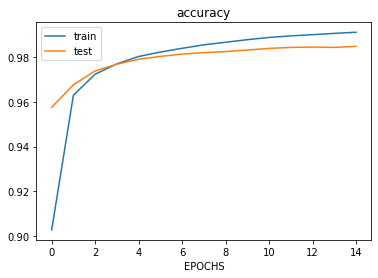

In [ ]:
plt.plot(range(EPOCHS), log['train_accuracy'])
plt.plot(range(EPOCHS), log['test_accuracy'])
plt.title('accuracy')
plt.xlabel('EPOCHS')
plt.legend(['train', 'test'])

plt.show()

- __3.2 10 and 0.1 times bigger__

In [ ]:
TRAINLOADER = Dataloader(X_train, Y_train, n_classes = 10, batch_size = 32, shuffle = False)
TESTLOADER = Dataloader(X_test, Y_test, n_classes = 10, batch_size = 32, shuffle = False)


network = FeedForwardNN(INPUT_SHAPE)
network.add_layer(n_neurons=40, input_shape=INPUT_SHAPE, activation=Relu(), weight_initializer='uniform')
network.add_layer(n_neurons=10, activation=Identical(), weight_initializer='uniform')
network.set_training_param(loss=CrossEntropy(), lr=0.015)

log = network.fit(EPOCHS, TRAINLOADER, TESTLOADER)

Epoch 1:
	Train: Average Accuracy: 0.09942200619305663	Average Loss: 2.333432710841824
	Test: Average Accuracy: 0.0979296875	Average Loss: 2.3065930953804776
Epoch 2:
	Train: Average Accuracy: 0.09935687488834634	Average Loss: 2.305987833081108
	Test: Average Accuracy: 0.0979296875	Average Loss: 2.3065930953804776
Epoch 3:
	Train: Average Accuracy: 0.09935687488834634	Average Loss: 2.305987833081108
	Test: Average Accuracy: 0.0979296875	Average Loss: 2.3065930953804776
Epoch 4:
	Train: Average Accuracy: 0.09935687488834634	Average Loss: 2.305987833081108
	Test: Average Accuracy: 0.0979296875	Average Loss: 2.3065930953804776
Epoch 5:
	Train: Average Accuracy: 0.09935687488834634	Average Loss: 2.305987833081108
	Test: Average Accuracy: 0.0979296875	Average Loss: 2.3065930953804776
Epoch 6:
	Train: Average Accuracy: 0.09935687488834634	Average Loss: 2.305987833081108
	Test: Average Accuracy: 0.0979296875	Average Loss: 2.3065930953804776
Epoch 7:
	Train: Average Accuracy: 0.099356874888346

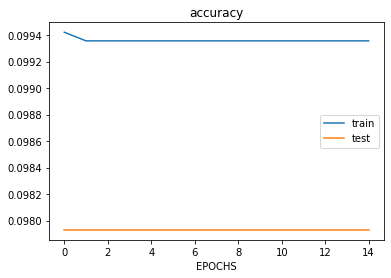

In [ ]:
plt.plot(range(EPOCHS), log['train_accuracy'])
plt.plot(range(EPOCHS), log['test_accuracy'])
plt.title('accuracy')
plt.xlabel('EPOCHS')
plt.legend(['train', 'test'])

plt.show()

In [ ]:
TRAINLOADER = Dataloader(X_train, Y_train, n_classes = 10, batch_size = 32, shuffle = False)
TESTLOADER = Dataloader(X_test, Y_test, n_classes = 10, batch_size = 32, shuffle = False)


network = FeedForwardNN(INPUT_SHAPE)
network.add_layer(n_neurons=40, input_shape=INPUT_SHAPE, activation=Relu(), weight_initializer='uniform')
network.add_layer(n_neurons=10, activation=Identical(), weight_initializer='uniform')
network.set_training_param(loss=CrossEntropy(), lr=LEARNING_RATE*0.1)

log = network.fit(EPOCHS, TRAINLOADER, TESTLOADER)

Epoch 1:
	Train: Average Accuracy: 0.6106245906032276	Average Loss: 1.2128913271488673
	Test: Average Accuracy: 0.8635312500000001	Average Loss: 0.46982682572465817
Epoch 2:
	Train: Average Accuracy: 0.8979987941404155	Average Loss: 0.35001542569908634
	Test: Average Accuracy: 0.9223203125	Average Loss: 0.27352091921912824
Epoch 3:
	Train: Average Accuracy: 0.9310854969332459	Average Loss: 0.24480044479469912
	Test: Average Accuracy: 0.9364609375	Average Loss: 0.22116085464711074
Epoch 4:
	Train: Average Accuracy: 0.9408161138569641	Average Loss: 0.20922799612036116
	Test: Average Accuracy: 0.942671875	Average Loss: 0.1974866083034529
Epoch 5:
	Train: Average Accuracy: 0.9460396444947299	Average Loss: 0.19067525572763516
	Test: Average Accuracy: 0.946734375	Average Loss: 0.18337536552661327
Epoch 6:
	Train: Average Accuracy: 0.9494004198177811	Average Loss: 0.1787840601972488
	Test: Average Accuracy: 0.950390625	Average Loss: 0.17385562509098051
Epoch 7:
	Train: Average Accuracy: 0.951

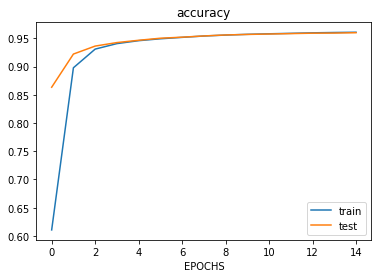

In [ ]:
plt.plot(range(EPOCHS), log['train_accuracy'])
plt.plot(range(EPOCHS), log['test_accuracy'])
plt.title('accuracy')
plt.xlabel('EPOCHS')
plt.legend(['train', 'test'])

plt.show()

- Large LR causes the model to converge faster to a suboptimal solution. In other words large learning rate allows the model to learn faster, while arriving on a sub-optimal final set of weights.
- Small LR causes stuck in the process. It also may allow the model to learn a more optimal or even globally optimal set of weights but may take significantly longer to train and may not converge at all. Small LR causes a problem called gradient vanishing.

small learning rate = slow convergence and vice versa

- # 4 Impact of Activation Function

- __4.1 Activation Functions Analysis__

In [ ]:
TRAINLOADER = Dataloader(X_train, Y_train, n_classes = 10, batch_size = 32, shuffle = False)
TESTLOADER = Dataloader(X_test, Y_test, n_classes = 10, batch_size = 32, shuffle = False)



warnings.filterwarnings('ignore')
network = FeedForwardNN(INPUT_SHAPE)
network.add_layer(n_neurons=40, input_shape=INPUT_SHAPE, activation=Sigmoid(), weight_initializer='uniform')
network.add_layer(n_neurons=10, activation=Identical(), weight_initializer='uniform')
network.set_training_param(loss=CrossEntropy(), lr=LEARNING_RATE)

log = network.fit(EPOCHS, TRAINLOADER, TESTLOADER)

Epoch 1:
	Train: Average Accuracy: 0.31322574882391474	Average Loss: 1.9528277314394924
	Test: Average Accuracy: 0.750578125	Average Loss: 0.9390383128243154
Epoch 2:
	Train: Average Accuracy: 0.8485343595545762	Average Loss: 0.6040624222089436
	Test: Average Accuracy: 0.878	Average Loss: 0.4864889988829175
Epoch 3:
	Train: Average Accuracy: 0.8812079437861012	Average Loss: 0.4553101123017694
	Test: Average Accuracy: 0.8867109375	Average Loss: 0.4113998738398337
Epoch 4:
	Train: Average Accuracy: 0.8936610492467099	Average Loss: 0.3829458077738765
	Test: Average Accuracy: 0.8995859375	Average Loss: 0.35738416747120594
Epoch 5:
	Train: Average Accuracy: 0.901082296194843	Average Loss: 0.34981655776885284
	Test: Average Accuracy: 0.9022265625	Average Loss: 0.3451970687383711
Epoch 6:
	Train: Average Accuracy: 0.8945040344191031	Average Loss: 0.35366239498708396
	Test: Average Accuracy: 0.890703125	Average Loss: 0.3712037324153939
Epoch 7:
	Train: Average Accuracy: 0.8803798457690705	Aver

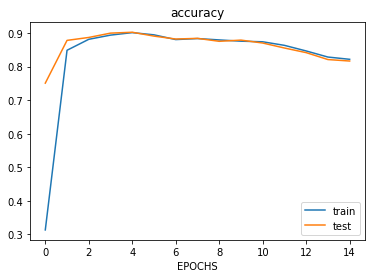

In [ ]:
plt.plot(range(EPOCHS), log['train_accuracy'])
plt.plot(range(EPOCHS), log['test_accuracy'])
plt.title('accuracy')
plt.xlabel('EPOCHS')
plt.legend(['train', 'test'])

plt.show()

## Sigmoid Function Analysis
- Low accuracy
- High compution time
- Network may stuck during training
- Normalizes the values (is always smaller than one)
- __Vanishing Gradients__

As we know gradient of Sigmoid is:

$$S′(a) = S(a)(1 − S(a))$$


and when $a$ grows to infinite, S' tends to zero. If we have many layers, we will multiply these gradients, and the product of many smaller than 1 values is zero. As the gradient value approaches zero, the network is not really learning because the weights are no longer updated in the backprpagation and the accuracy of our neural network will not increase anymore.

In [ ]:
TRAINLOADER = Dataloader(X_train, Y_train, n_classes = 10, batch_size = 32, shuffle = False)
TESTLOADER = Dataloader(X_test, Y_test, n_classes = 10, batch_size = 32, shuffle = False)


network = FeedForwardNN(INPUT_SHAPE)
network.add_layer(n_neurons=40, input_shape=INPUT_SHAPE, activation=Tanh(), weight_initializer='uniform')
network.add_layer(n_neurons=10, activation=Identical(), weight_initializer='uniform')
network.set_training_param(loss=CrossEntropy(), lr=LEARNING_RATE)

log = network.fit(EPOCHS, TRAINLOADER, TESTLOADER)

Epoch 1:
	Train: Average Accuracy: 0.5525572411123683	Average Loss: 1.285179565185662
	Test: Average Accuracy: 0.909484375	Average Loss: 0.3170003043157488
Epoch 2:
	Train: Average Accuracy: 0.9392045792889895	Average Loss: 0.21515045048071046
	Test: Average Accuracy: 0.952359375	Average Loss: 0.1720958818871727
Epoch 3:
	Train: Average Accuracy: 0.9587048919192521	Average Loss: 0.14838208343819698
	Test: Average Accuracy: 0.960390625	Average Loss: 0.14253858256074523
Epoch 4:
	Train: Average Accuracy: 0.9656088102185435	Average Loss: 0.12468034824745984
	Test: Average Accuracy: 0.9640625	Average Loss: 0.12690136454605905
Epoch 5:
	Train: Average Accuracy: 0.9690886827844936	Average Loss: 0.11017239329172934
	Test: Average Accuracy: 0.967421875	Average Loss: 0.11615454972706928
Epoch 6:
	Train: Average Accuracy: 0.9719805127136307	Average Loss: 0.09959755020055712
	Test: Average Accuracy: 0.9700390625	Average Loss: 0.1081474098753982
Epoch 7:
	Train: Average Accuracy: 0.974624843684868

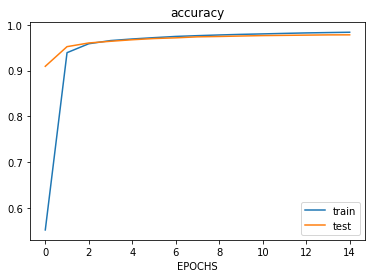

In [ ]:
plt.plot(range(EPOCHS), log['train_accuracy'])
plt.plot(range(EPOCHS), log['test_accuracy'])
plt.title('accuracy')
plt.xlabel('EPOCHS')
plt.legend(['train', 'test'])

plt.show()

# Hyperbolic Tangent Analysis

- Data is centered around zero. (between -1, 1)
- Higher derivates
- Faster convergence
- Saturation at asymptotes
- Weak training signal
- __Vanishing Gradients__


Tanh converges faster than sigmoid but still has the Vanishing Gradients problem.

In [ ]:
TRAINLOADER = Dataloader(X_train, Y_train, n_classes = 10, batch_size = 32, shuffle = False)
TESTLOADER = Dataloader(X_test, Y_test, n_classes = 10, batch_size = 32, shuffle = False)


network = FeedForwardNN(INPUT_SHAPE)
network.add_layer(n_neurons=40, input_shape=INPUT_SHAPE, activation=LeakyRelu(), weight_initializer='uniform')
network.add_layer(n_neurons=10, activation=Identical(), weight_initializer='uniform')
network.set_training_param(loss=CrossEntropy(), lr=LEARNING_RATE)

log = network.fit(EPOCHS, TRAINLOADER, TESTLOADER)

Epoch 1:
	Train: Average Accuracy: 0.9016517298874531	Average Loss: 0.3676278135378292
	Test: Average Accuracy: 0.9591796875	Average Loss: 0.14974928328954001
Epoch 2:
	Train: Average Accuracy: 0.963461338057524	Average Loss: 0.1324731833467367
	Test: Average Accuracy: 0.9680859375	Average Loss: 0.11504252633640238
Epoch 3:
	Train: Average Accuracy: 0.971837223843268	Average Loss: 0.10343085926516658
	Test: Average Accuracy: 0.9734765625	Average Loss: 0.09651408850631552
Epoch 4:
	Train: Average Accuracy: 0.9767220716965402	Average Loss: 0.08584699252188203
	Test: Average Accuracy: 0.976484375	Average Loss: 0.08503819428834752
Epoch 5:
	Train: Average Accuracy: 0.9795878491037933	Average Loss: 0.07405167866421863
	Test: Average Accuracy: 0.97796875	Average Loss: 0.07713289318070574
Epoch 6:
	Train: Average Accuracy: 0.9815938932888704	Average Loss: 0.06547306983657541
	Test: Average Accuracy: 0.979375	Average Loss: 0.07095896740539731
Epoch 7:
	Train: Average Accuracy: 0.98340454355981

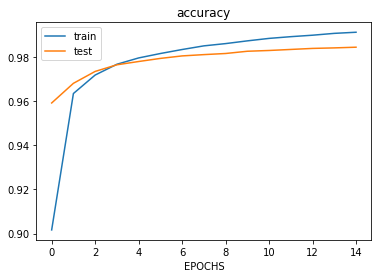

In [ ]:
plt.plot(range(EPOCHS), log['train_accuracy'])
plt.plot(range(EPOCHS), log['test_accuracy'])
plt.title('accuracy')
plt.xlabel('EPOCHS')
plt.legend(['train', 'test'])

plt.show()

# Leaky Relu Analysis
- Gradient is a constant
- High accuracy
- Faster in convergence
- Faster computation
- The problem is that it's not consistent
- __No saturation__
- __NO Vanishing Gradient!__

- __4.2 Disadvantages of Tanh and Sigmoid Functions__


__Sigmoid__ and __Tanh__ activation functions have _Vanishing Gradient_ problem. So the derivations of these functions are between 0, 0.25 and 0, 1. Therefore, the updated weight values are small, and the new weight values are very similar to the old weight values. Also there is another problem which is we have _over-fitting_.

- __4.3 Advantages of Leaky Relu over Relu__


__Dying ReLU:__ When the value is negative, no learning happens as the new weight remains equal to the old weight since the value of the derivative is 0. Because when we have positive value Relu gives the derivate = 1. Also when we have negative value Relu gives the derivative = 0 during the backpropagation. Leaky Relu solved this issue.

__Faster:__ Leaky Relu is faster in training. Because “mean activation” close to 0 makes training faster.

__Balanced:__ Leaky ReLU is more balanced, and learns faster

__Slope for negative values:__ Leaky Relu has a slope for negative values while Relu deletes these values.

# 5 Impact of Batch Size

- __5.1 Small and Big batch size__

In [ ]:
TRAINLOADER = Dataloader(X_train, Y_train, n_classes = 10, batch_size = 16, shuffle = False)
TESTLOADER = Dataloader(X_test, Y_test, n_classes = 10, batch_size = 16, shuffle = False)


network = FeedForwardNN(INPUT_SHAPE)
network.add_layer(n_neurons=40, input_shape=INPUT_SHAPE, activation=LeakyRelu(), weight_initializer='uniform')
network.add_layer(n_neurons=10, activation=Identical(), weight_initializer='uniform')
network.set_training_param(loss=CrossEntropy(), lr=LEARNING_RATE)

log = network.fit(EPOCHS, TRAINLOADER, TESTLOADER)

Epoch 1:
	Train: Average Accuracy: 0.9002579199666527	Average Loss: 0.3539888956924156
	Test: Average Accuracy: 0.95640625	Average Loss: 0.15618841643171444
Epoch 2:
	Train: Average Accuracy: 0.9612338474364318	Average Loss: 0.13927647546706615
	Test: Average Accuracy: 0.9659375	Average Loss: 0.12293954792243572
Epoch 3:
	Train: Average Accuracy: 0.970495518966236	Average Loss: 0.10989319907154725
	Test: Average Accuracy: 0.9719921875	Average Loss: 0.10136271625071465
Epoch 4:
	Train: Average Accuracy: 0.9758623384743643	Average Loss: 0.0898596261466522
	Test: Average Accuracy: 0.975078125	Average Loss: 0.08736146776934632
Epoch 5:
	Train: Average Accuracy: 0.9789365360566903	Average Loss: 0.07677463886691444
	Test: Average Accuracy: 0.97765625	Average Loss: 0.07836406826665138
Epoch 6:
	Train: Average Accuracy: 0.9813594205919133	Average Loss: 0.06748330486325795
	Test: Average Accuracy: 0.979140625	Average Loss: 0.07190774948538087
Epoch 7:
	Train: Average Accuracy: 0.983495727386411

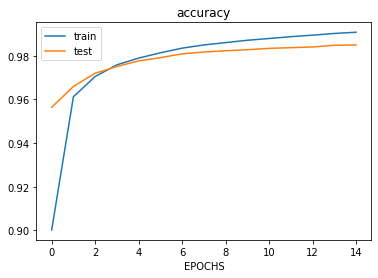

In [ ]:
plt.plot(range(EPOCHS), log['train_accuracy'])
plt.plot(range(EPOCHS), log['test_accuracy'])
plt.title('accuracy')
plt.xlabel('EPOCHS')
plt.legend(['train', 'test'])

plt.show()

Small batch size makes the gradient estimate a little bit noisy which might allow us to bypass a local optimum during convergence.

In [ ]:
TRAINLOADER = Dataloader(X_train, Y_train, n_classes = 10, batch_size = 256, shuffle = False)
TESTLOADER = Dataloader(X_test, Y_test, n_classes = 10, batch_size = 256, shuffle = False)


network = FeedForwardNN(INPUT_SHAPE)
network.add_layer(n_neurons=40, input_shape=INPUT_SHAPE, activation=LeakyRelu(), weight_initializer='uniform')
network.add_layer(n_neurons=10, activation=Identical(), weight_initializer='uniform')
network.set_training_param(loss=CrossEntropy(), lr=LEARNING_RATE)

log = network.fit(EPOCHS, TRAINLOADER, TESTLOADER)

Epoch 1:
	Train: Average Accuracy: 0.19132339015151514	Average Loss: 2.3106075971651676
	Test: Average Accuracy: 0.3438351690573771	Average Loss: 1.7367842628066525
Epoch 2:
	Train: Average Accuracy: 0.3880198863636364	Average Loss: 1.543332775273691
	Test: Average Accuracy: 0.35385502049180323	Average Loss: 1.5926840828545032
Epoch 3:
	Train: Average Accuracy: 0.4549346590909091	Average Loss: 1.438604716232954
	Test: Average Accuracy: 0.5204649077868853	Average Loss: 1.2175762307439812
Epoch 4:
	Train: Average Accuracy: 0.7633671875	Average Loss: 0.7645729126457778
	Test: Average Accuracy: 0.8620850409836065	Average Loss: 0.43799366898476194
Epoch 5:
	Train: Average Accuracy: 0.8553939393939394	Average Loss: 0.48413535106145017
	Test: Average Accuracy: 0.877126024590164	Average Loss: 0.3989146456991677
Epoch 6:
	Train: Average Accuracy: 0.8756500946969697	Average Loss: 0.4230901567905885
	Test: Average Accuracy: 0.878147412909836	Average Loss: 0.3941503809707715
Epoch 7:
	Train: Avera

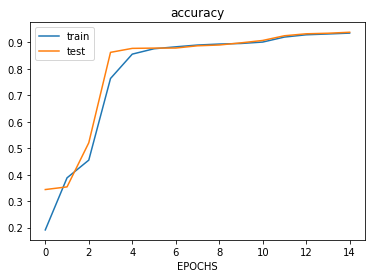

In [ ]:
plt.plot(range(EPOCHS), log['train_accuracy'])
plt.plot(range(EPOCHS), log['test_accuracy'])
plt.title('accuracy')
plt.xlabel('EPOCHS')
plt.legend(['train', 'test'])

plt.show()

Bigger batch size is not optimum. This is because of local optimums in neural networks. So that just having an accurate gradient estimate doesn't guarantee us reaching the global optimum. We could get stuck in a local optimum. Also bigger batch size is not generalized and over-fitting may occur and doesn't converge at all.

- __5.2 whats is batch size__

The main reason to use batches in training is because of the fact that we don't have infinite memory. By using batches, we can divide the program's memory into different parts. Also, if we don't use batches, we would need to store thousands of error values in the memory and this will decrease our training speed. On the other hand, say our batch size is 32, then we only need to store the error values for 32 neurons. Also Batch size controls the accuracy of the estimate of the error gradient when training neural networks. There is a tension between batch size and the speed and stability of the learning process.

- __5.2 Advantages of small batch size__


- The model update frequency is higher than batch gradient descent which allows for a more robust convergence, avoiding local minimal
- It takes less memory
- More generalized
- Higher accuracy
- Faster convergence
- The batched updates provide a computationally more efficient process than stochastic gradient descent.
- Smaller batch sizes make it easier to fit one batch worth of training data in memory (i.e. when using a GPU)

- __5.2 Disadvantages of small batch size__


- Your gradient estimation is very noisy. This may cause your model to either diverge or to converge at a non optimal minima. Also not guaranteed to converge to the global optimal
- Since you are using a small batch size, you are always suffering from sample bias. You are over-fitting the mini-batch distribution and not the actual distribution of the dataset. This means reduced accuracy.
- NO computational constraints

# Conclusion
